<a href="https://colab.research.google.com/github/benjawad/Portfolio/blob/main/transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint

In [ ]:
import os

# Define the folder name
folder_name = 'output'

# Create the folder
os.makedirs(folder_name, exist_ok=True)

In [ ]:
from google.colab import files

# This will prompt you to upload the ZIP file
uploaded = files.upload()

Saving fond_ecran.jpg to fond_ecran.jpg
Saving sktch.jpg to sktch.jpg
Saving van_gor.jpg to van_gor.jpg
Saving dragon_ball.jpg to dragon_ball.jpg
Saving camp-nou.jpg to camp-nou.jpg
Saving cat.jpg to cat.jpg
Saving claude-monet.jpg to claude-monet.jpg
Saving content.jpeg to content.jpeg
Saving content_plus_style.png to content_plus_style.png
Saving content300.jpg to content300.jpg
Saving drop-of-water.jpg to drop-of-water.jpg
Saving gram.png to gram.png
Saving hidden_layers.png to hidden_layers.png
Saving louvre.jpg to louvre.jpg
Saving louvre_generated.png to louvre_generated.png
Saving louvre_small.jpg to louvre_small.jpg
Saving monet.jpg to monet.jpg
Saving monet_800600.jpg to monet_800600.jpg
Saving NST_GM.png to NST_GM.png
Saving pasargad_kashi.png to pasargad_kashi.png
Saving persian_cat_content.jpg to persian_cat_content.jpg
Saving perspolis_vangogh.png to perspolis_vangogh.png
Saving reshape_loss.png to reshape_loss.png
Saving result.png to result.png
Saving sandstone.jpg to sa

In [ ]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='imagenet')


vgg.trainable = False
pp.pprint(vgg)

<Functional name=vgg19, built=True>


The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.


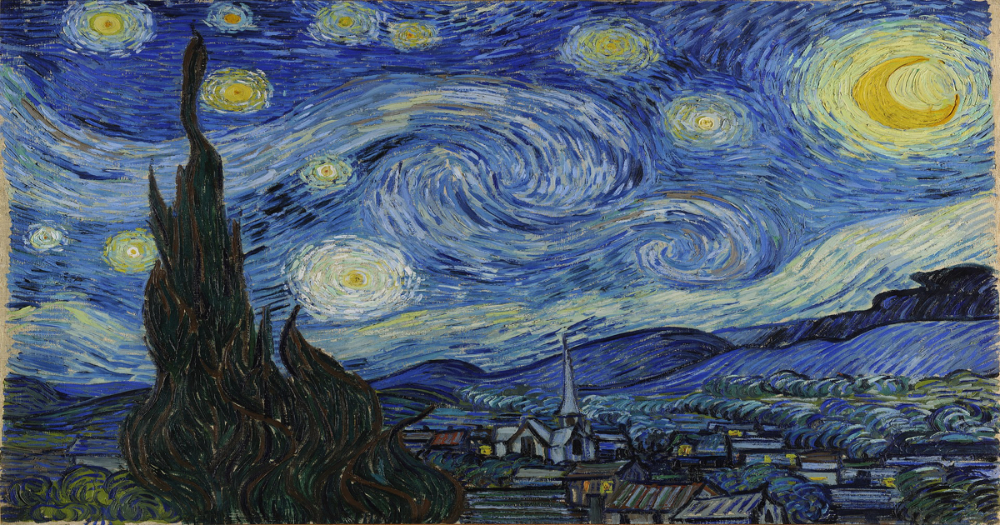

In [ ]:
content_image = Image.open("images/van_gor.jpg")
print("The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.")
content_image

In [ ]:
def compute_content_cost(content_output, generated_output):

    a_C = content_output[-1]
    a_G = generated_output[-1]

    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape()

    # Reshape 'a_C' and 'a_G' (≈2 lines)
    # DO NOT reshape 'content_output' or 'generated_output'
    a_C_unrolled = tf.reshape(a_C ,shape = [-1,n_H* n_W,n_C] )
    a_G_unrolled = tf.reshape(a_G ,shape = [-1,n_H* n_W,n_C] )

    # compute the cost with tensorflow (≈1 line)
    J_content = (1 / (4 *n_H * n_W * n_C))  * tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled,a_G_unrolled)))
    return J_content

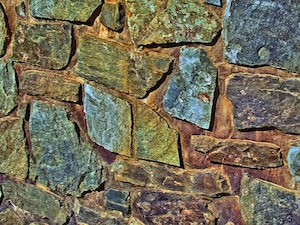

In [ ]:
example = Image.open("images/stone_style.jpg")
example

In [ ]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)

    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    GA = tf.matmul(A,tf.transpose(A))
    return GA

In [ ]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G

    Returns:
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    ### START CODE HERE

    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape()

    # Reshape the tensors from (1, n_H, n_W, n_C) to (n_C, n_H * n_W) (≈2 lines)
    a_S =  tf.transpose(tf.reshape(a_S,shape =[n_H * n_W,n_C ] ))
    a_G =  tf.transpose(tf.reshape(a_G,shape =[n_H * n_W,n_C ] ))

    # Computing gram_matrices for both images S and G (≈2 lines)
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)
    # Computing the loss (≈1 line)
    J_style_layer =  tf.reduce_sum(tf.square(GS - GG) ) /(4 * ((n_H * n_W * n_C)**2))
    print(J_style_layer)
    ### END CODE HERE

    return J_style_layer

In [ ]:
for layer in vgg.layers:
    print(layer.name)

input_layer
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
vgg.get_layer('block5_conv4').output

<KerasTensor shape=(None, 25, 25, 512), dtype=float32, sparse=False, name=keras_tensor_20>

In [ ]:
STYLE_LAYERS = [
    ('block1_conv1', 0.5),
    ('block2_conv1', 0.5),
    ('block3_conv1', 0.5),
    ('block4_conv1', 0.5),
    ('block5_conv1', 0.5)]

In [ ]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers

    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them

    Returns:
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """

    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

In [ ]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 100):
    J = alpha * J_content + beta * J_style
    return J

(1, 400, 400, 3)


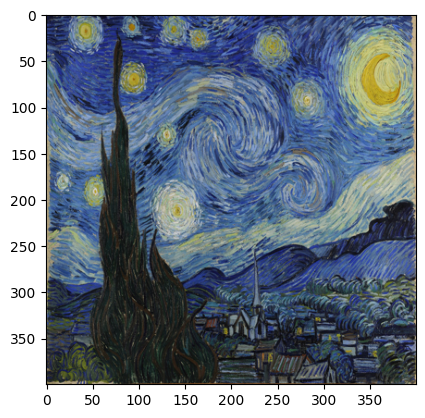

In [ ]:
content_image = np.array(Image.open("images/van_gor.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 400, 400, 3)


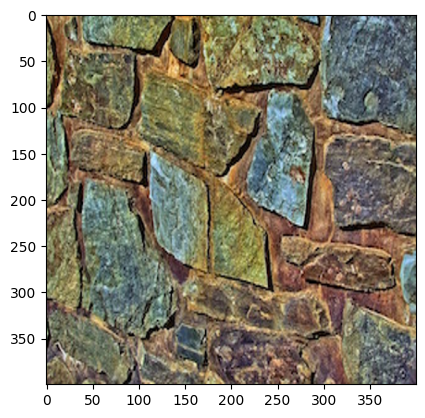

In [ ]:
style_image =  np.array(Image.open("images/stone_style.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


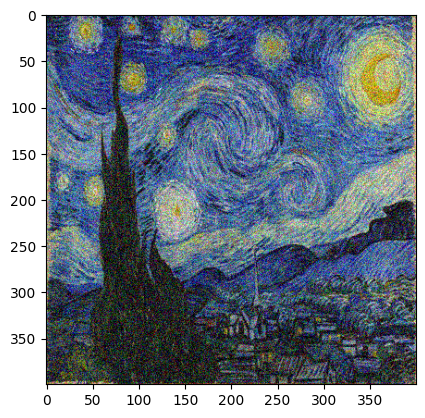

In [ ]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [ ]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [ ]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [ ]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style encoder

In [ ]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [ ]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [ ]:
def clip_0_1(image):
    """Truncate all the pixels in the tensor to be between 0 and 1"""
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """Converts the given tensor into a PIL image"""
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C

        ### START CODE HERE

        # Compute a_G as the vgg_model_outputs for the current generated image
        #(1 line)
        a_G = vgg_model_outputs(generated_image)

        # Compute the style cost
        #(1 line)
        J_style = compute_style_cost(a_S, a_G, STYLE_LAYERS=STYLE_LAYERS)

        #(2 lines)
        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style)

        ### END CODE HERE

    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    # For grading purposes
    return J

Tensor("truediv:0", shape=(), dtype=float32)
Tensor("truediv_1:0", shape=(), dtype=float32)
Tensor("truediv_2:0", shape=(), dtype=float32)
Tensor("truediv_3:0", shape=(), dtype=float32)
Tensor("truediv_4:0", shape=(), dtype=float32)
Tensor("truediv:0", shape=(), dtype=float32)
Tensor("truediv_1:0", shape=(), dtype=float32)
Tensor("truediv_2:0", shape=(), dtype=float32)
Tensor("truediv_3:0", shape=(), dtype=float32)
Tensor("truediv_4:0", shape=(), dtype=float32)
Epoch 0 


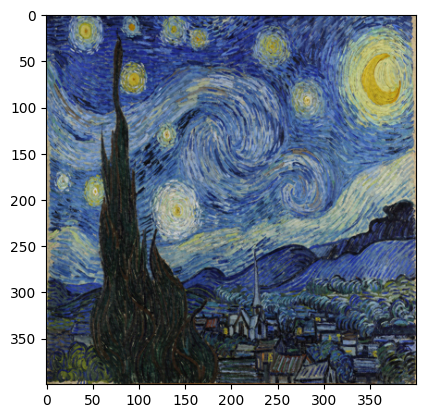

Epoch 250 


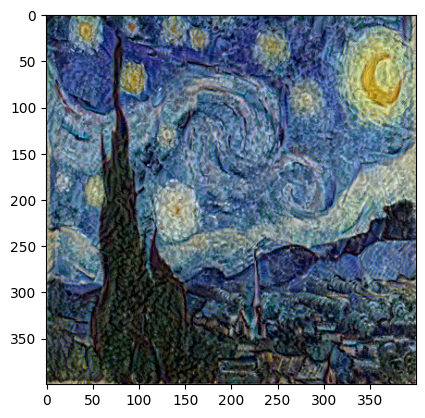

Epoch 500 


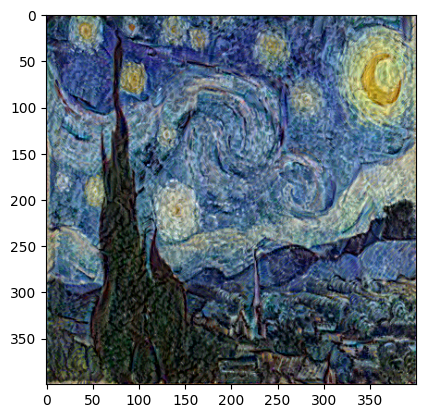

Epoch 750 


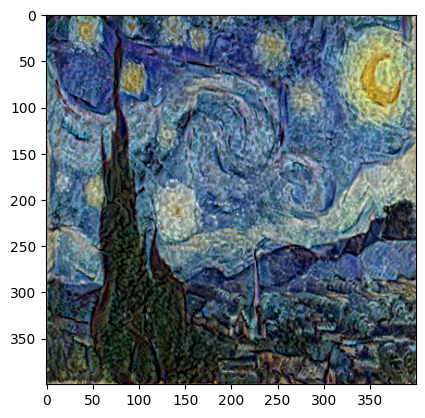

Epoch 1000 


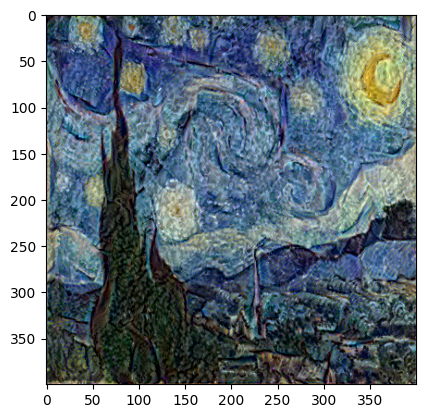

Epoch 1250 


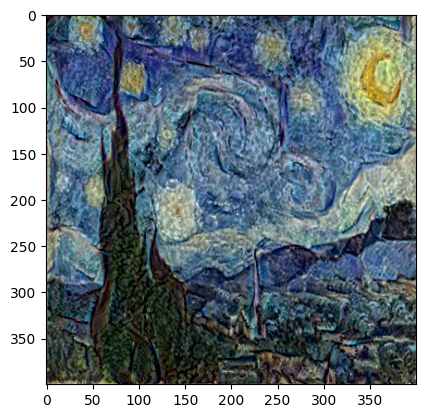

Epoch 1500 


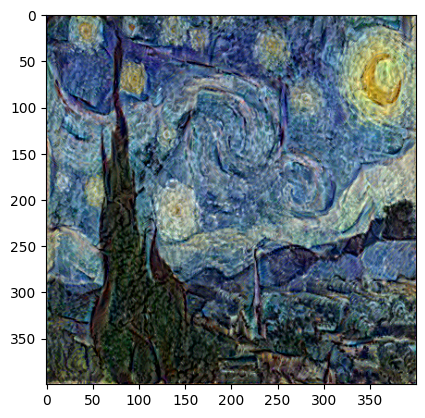

Epoch 1750 


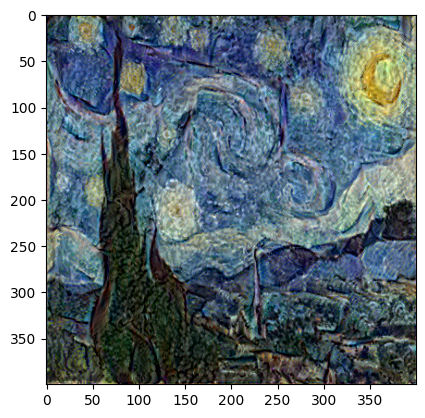

Epoch 2000 


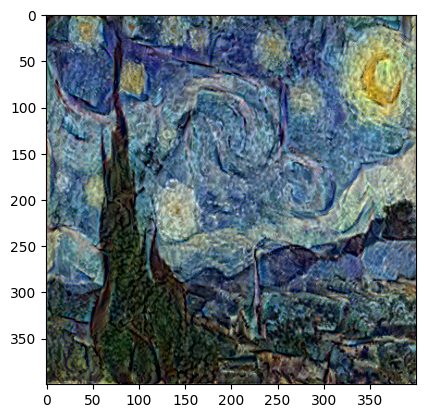

Epoch 2250 


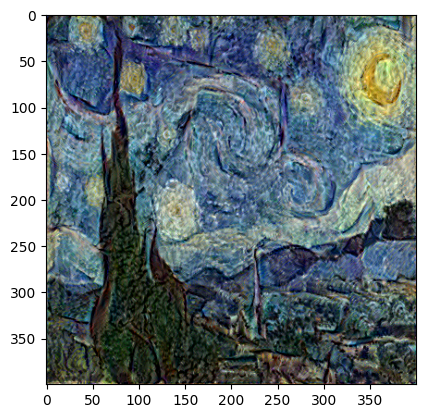

Epoch 2500 


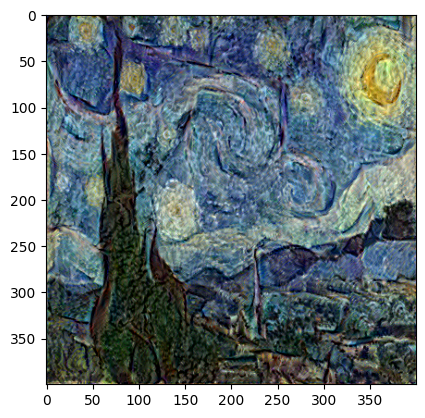

Epoch 2750 


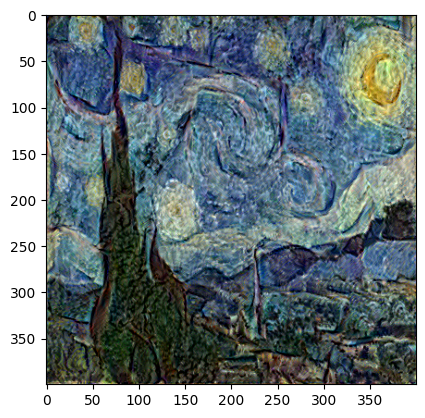

Epoch 3000 


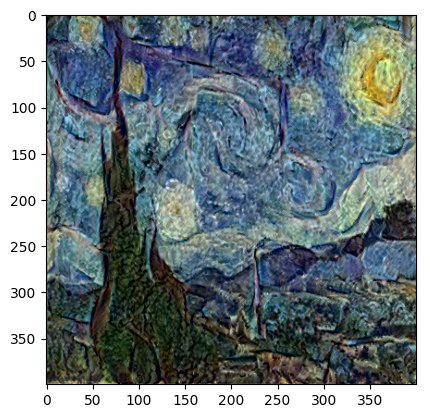

Epoch 3250 


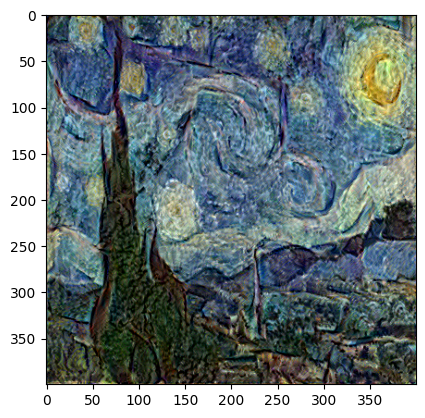

Epoch 3500 


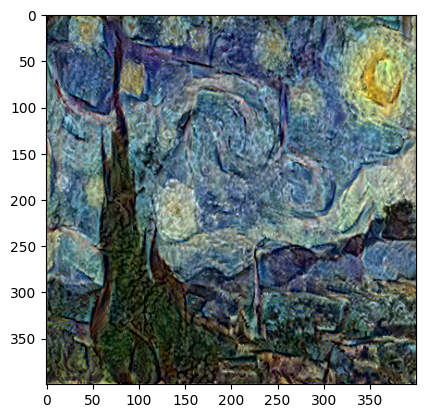

Epoch 3750 


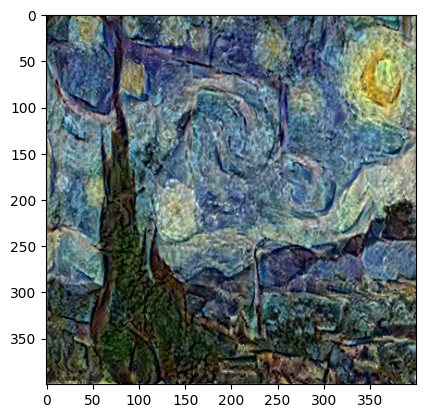

Epoch 4000 


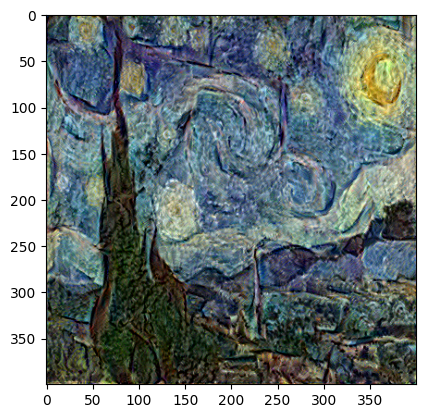

Epoch 4250 


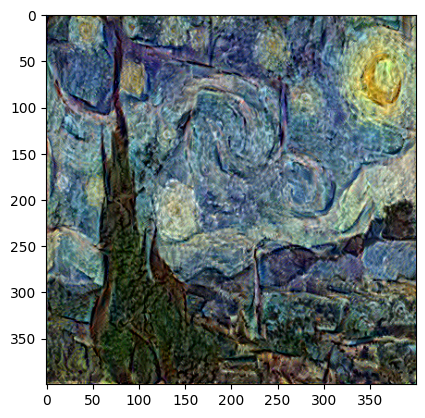

Epoch 4500 


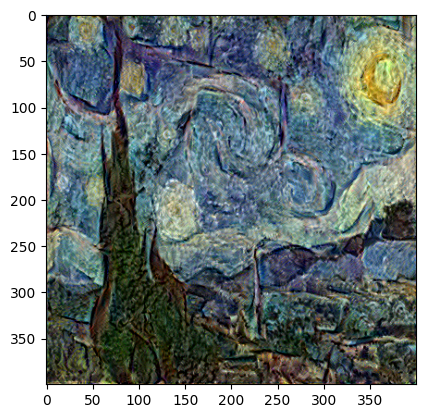

Epoch 4750 


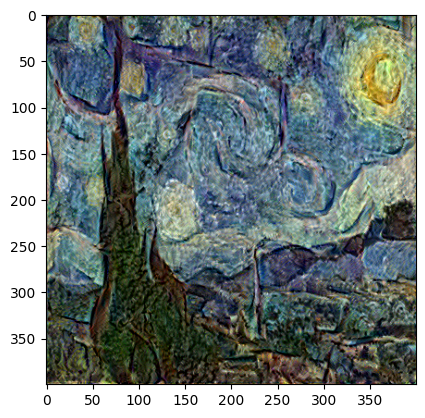

Epoch 5000 


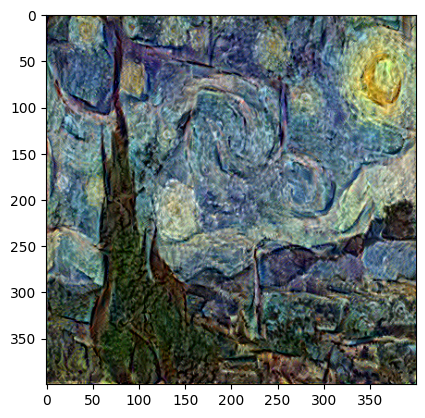

Epoch 5250 


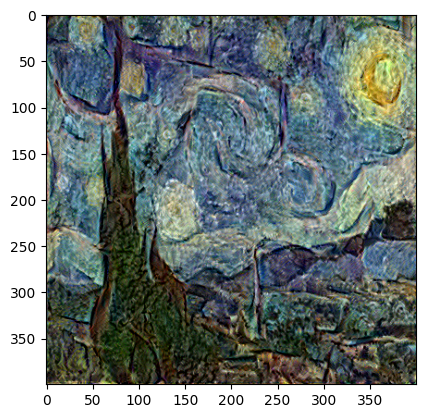

Epoch 5500 


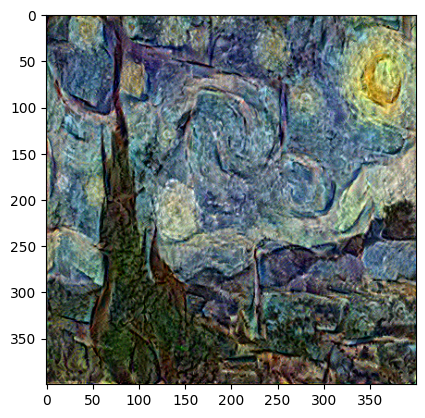

In [ ]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))

epochs = 5501
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"output/image_{i}.jpg")
        plt.show()

In [ ]:
vgg_model_outputs.save("my_model.keras")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')